# Food Deserts in Northern CA
---

## ...

In [1]:
# Dependencies and Setup
import hvplot.pandas
import pandas as pd
import requests

In [2]:
# Load the CSV file created in Part 1 into a Pandas DataFrame
food_deserts_usa = pd.read_csv("Resources/StateAndCountyData.csv")

# Display sample data
food_deserts_usa.head()

,FIPS,State,County,Variable_Code,Value
0,1001,AL,Autauga,LACCESS_POP10,18428.439690
1,1001,AL,Autauga,LACCESS_POP15,17496.693040
2,1001,AL,Autauga,PCH_LACCESS_POP_10_15,-5.056026
3,1001,AL,Autauga,PCT_LACCESS_POP10,33.769657
4,1001,AL,Autauga,PCT_LACCESS_POP15,32.062255


---

### Create Clean DataFrames for CA, The Bay Area, Greater Sacremento, and The Cental Valley.

In [3]:
#create a df that includes only the Counties in CA
food_deserts_ca = food_deserts_usa.loc[food_deserts_usa['State'] == 'CA']

food_deserts_ca


,FIPS,State,County,Variable_Code,Value
7625,6001,CA,Alameda,LACCESS_POP10,1.604249e+05
7626,6001,CA,Alameda,LACCESS_POP15,1.079644e+05
7627,6001,CA,Alameda,PCH_LACCESS_POP_10_15,-3.270098e+01
7628,6001,CA,Alameda,PCT_LACCESS_POP10,1.062226e+01
7629,6001,CA,Alameda,PCT_LACCESS_POP15,7.148677e+00
...,...,...,...,...,...
850873,6,CA,Total,State_Population_2014,3.862514e+07
850874,6,CA,Total,State_Population_2015,3.895314e+07
850875,6,CA,Total,State_Population_2016,3.920913e+07
850876,6,CA,Total,State_Population_2017,3.939935e+07


In [4]:
#Rotate the "Variable Codes" into the columns and then match them with the corresponding "Values" 
food_deserts_ca = food_deserts_ca.pivot_table(index=['County', 'FIPS'], columns='Variable_Code', values='Value')
food_deserts_ca.head()

,Variable_Code,AGRITRSM_OPS07,AGRITRSM_OPS12,AGRITRSM_RCT07,AGRITRSM_RCT12,BERRY_ACRES07,BERRY_ACRES12,BERRY_ACRESPTH07,BERRY_ACRESPTH12,BERRY_FARMS07,BERRY_FARMS12,...,WICS16,WICSPTH11,WICSPTH16,WIC_PART_2012,WIC_PART_2013,WIC_PART_2014,WIC_PART_2015,WIC_PART_2016,WIC_PART_2017,WIC_PART_2018
County,FIPS,,,,,,,,,,,,,,,,,,,,,
Alameda,6001,4.0,16.0,29000.0,196000.0,NaN,2.0,NaN,0.001285,1.0,8.0,...,145.0,0.116264,0.087862,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Alpine,6003,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Amador,6005,5.0,13.0,NaN,1037000.0,NaN,2.0,NaN,0.053910,2.0,11.0,...,9.0,0.239757,0.240397,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Butte,6007,22.0,38.0,287000.0,392000.0,65.0,84.0,0.298893,0.379738,33.0,34.0,...,23.0,0.131847,0.101532,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Calaveras,6009,6.0,20.0,116000.0,1493000.0,23.0,20.0,0.497104,0.446877,14.0,14.0,...,7.0,0.243578,0.154515,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#print the California data to a csv
food_deserts_ca.to_csv("Outputs/all_ca_data.csv", index_label="County")

### Step 2: Narrow down the `food_deserts_ca` DataFrame to regions

In [6]:
rest_and_grocery_columns = ['GROC11', "GROC16", "PCH_GROC_11_16", "SUPERC11", "SUPERC16", 
                            "PCH_SUPERC_11_16", "SPECS11", "SPECS16", "PCH_SPECS_11_16", "FFR11",
                             "FFR16", "PCH_FFR_11_16", 'FSR11', 'FSR16', 'PCH_FSR_11_16'] 

df_2 = pd.DataFrame([])

def function1(df_1, df_2):

    df_2 = df_1[rest_and_grocery_columns]

    df_2 = df_2.rename(columns={'GROC11': 'Grocery stores, 2011', 
                                                'GROC16': 'Grocery stores, 2016',
                                                'PCH_GROC_11_16': '% Change in grocery stores, 2011-2016',
                                                'SUPERC11': 'Supercenters, 2011',
                                                'SUPERC16': 'Supercenters, 2016',
                                                'PCH_SUPERC_11_16': '% Change in supercenters, 2011-2016',
                                                'SPECS11': 'Specialized food stores, 2011',
                                                'SPECS16': 'Specialized food stores, 2016',
                                                'PCH_SPECS_11_16': '% Change in specialized food stores, 2011-2016',
                                                'FFR11': 'Fast-food restaurants, 2011',
                                                'FFR16': 'Fast-food restaurants, 2016',
                                                'PCH_FFR_11_16': '% Change in fast-food restaurants, 2011-2016',
                                                'FSR11': 'Full-service restaurants, 2011',
                                                'FSR16': 'Full-service restaurants, 2016',
                                                'PCH_FSR_11_16': '% Change in full-service restaurants, 2011-2016'})
    df_2 = df_2.fillna(0)

    return df_2

rest_and_grocery_data_ca = pd.DataFrame([])

rest_and_grocery_data_ca = function1(food_deserts_ca, rest_and_grocery_data_ca)

rest_and_grocery_data_ca.head()

,Variable_Code,"Grocery stores, 2011","Grocery stores, 2016","% Change in grocery stores, 2011-2016","Supercenters, 2011","Supercenters, 2016","% Change in supercenters, 2011-2016","Specialized food stores, 2011","Specialized food stores, 2016","% Change in specialized food stores, 2011-2016","Fast-food restaurants, 2011","Fast-food restaurants, 2016","% Change in fast-food restaurants, 2011-2016","Full-service restaurants, 2011","Full-service restaurants, 2016","% Change in full-service restaurants, 2011-2016"
County,FIPS,,,,,,,,,,,,,,,
Alameda,6001,387.0,372.0,-3.875969,6.0,6.0,0.0,156.0,133.0,-14.743590,1090.0,1293.0,18.623853,1401.0,1560.0,11.349036
Alpine,6003,1.0,0.0,-100.000000,0.0,0.0,0.0,0.0,0.0,0.000000,2.0,0.0,-100.000000,3.0,1.0,-66.666667
Amador,6005,11.0,13.0,18.181818,0.0,0.0,0.0,2.0,5.0,150.000000,12.0,21.0,75.000000,39.0,44.0,12.820513
Butte,6007,46.0,45.0,-2.173913,1.0,1.0,0.0,18.0,13.0,-27.777778,147.0,158.0,7.482993,125.0,132.0,5.600000
Calaveras,6009,13.0,11.0,-15.384615,0.0,0.0,0.0,4.0,3.0,-25.000000,26.0,30.0,15.384615,39.0,41.0,5.128205


In [7]:
rest_and_grocery_data_ca = function1(food_deserts_ca, rest_and_grocery_data_ca)

rest_and_grocery_data_ca.head()

,Variable_Code,"Grocery stores, 2011","Grocery stores, 2016","% Change in grocery stores, 2011-2016","Supercenters, 2011","Supercenters, 2016","% Change in supercenters, 2011-2016","Specialized food stores, 2011","Specialized food stores, 2016","% Change in specialized food stores, 2011-2016","Fast-food restaurants, 2011","Fast-food restaurants, 2016","% Change in fast-food restaurants, 2011-2016","Full-service restaurants, 2011","Full-service restaurants, 2016","% Change in full-service restaurants, 2011-2016"
County,FIPS,,,,,,,,,,,,,,,
Alameda,6001,387.0,372.0,-3.875969,6.0,6.0,0.0,156.0,133.0,-14.743590,1090.0,1293.0,18.623853,1401.0,1560.0,11.349036
Alpine,6003,1.0,0.0,-100.000000,0.0,0.0,0.0,0.0,0.0,0.000000,2.0,0.0,-100.000000,3.0,1.0,-66.666667
Amador,6005,11.0,13.0,18.181818,0.0,0.0,0.0,2.0,5.0,150.000000,12.0,21.0,75.000000,39.0,44.0,12.820513
Butte,6007,46.0,45.0,-2.173913,1.0,1.0,0.0,18.0,13.0,-27.777778,147.0,158.0,7.482993,125.0,132.0,5.600000
Calaveras,6009,13.0,11.0,-15.384615,0.0,0.0,0.0,4.0,3.0,-25.000000,26.0,30.0,15.384615,39.0,41.0,5.128205


In [8]:
bay_area_counties = ['Alameda', 'Contra Costa', 'Marin', 'Napa', 
                     'San Francisco', 'San Mateo', 'Santa Clara', 
                     'Solano', 'Sonoma']
bay_area_desert = food_deserts_ca.loc[bay_area_counties]

In [9]:
ba_rest_and_grocery_data = pd.DataFrame([])
ba_rest_and_grocery_data = function1(bay_area_desert, ba_rest_and_grocery_data)

ba_rest_and_grocery_data.head()

,Variable_Code,"Grocery stores, 2011","Grocery stores, 2016","% Change in grocery stores, 2011-2016","Supercenters, 2011","Supercenters, 2016","% Change in supercenters, 2011-2016","Specialized food stores, 2011","Specialized food stores, 2016","% Change in specialized food stores, 2011-2016","Fast-food restaurants, 2011","Fast-food restaurants, 2016","% Change in fast-food restaurants, 2011-2016","Full-service restaurants, 2011","Full-service restaurants, 2016","% Change in full-service restaurants, 2011-2016"
County,FIPS,,,,,,,,,,,,,,,
Alameda,6001,387.0,372.0,-3.875969,6.0,6.0,0.0,156.0,133.0,-14.743590,1090.0,1293.0,18.623853,1401.0,1560.0,11.349036
Contra Costa,6013,210.0,200.0,-4.761905,5.0,5.0,0.0,68.0,76.0,11.764706,599.0,701.0,17.028381,686.0,757.0,10.349854
Marin,6041,64.0,70.0,9.375000,1.0,1.0,0.0,25.0,15.0,-40.000000,171.0,189.0,10.526316,302.0,313.0,3.642384
Napa,6055,38.0,40.0,5.263158,1.0,2.0,100.0,16.0,14.0,-12.500000,76.0,82.0,7.894737,134.0,150.0,11.940299
San Francisco,6075,319.0,358.0,12.225705,1.0,1.0,0.0,187.0,178.0,-4.812834,753.0,958.0,27.224436,1764.0,1917.0,8.673469


In [10]:
sacramento_counties = ['Amador', 'Calaveras', 'El Dorado', 'Placer', 
                        'Sacramento', 'Yolo']
    
sacramento_desert = food_deserts_ca.loc[sacramento_counties]

In [11]:
sac_rest_and_grocery_data = pd.DataFrame([])

sac_rest_and_grocery_data = function1(sacramento_desert, sac_rest_and_grocery_data)

sac_rest_and_grocery_data.head()

,Variable_Code,"Grocery stores, 2011","Grocery stores, 2016","% Change in grocery stores, 2011-2016","Supercenters, 2011","Supercenters, 2016","% Change in supercenters, 2011-2016","Specialized food stores, 2011","Specialized food stores, 2016","% Change in specialized food stores, 2011-2016","Fast-food restaurants, 2011","Fast-food restaurants, 2016","% Change in fast-food restaurants, 2011-2016","Full-service restaurants, 2011","Full-service restaurants, 2016","% Change in full-service restaurants, 2011-2016"
County,FIPS,,,,,,,,,,,,,,,
Amador,6005,11.0,13.0,18.181818,0.0,0.0,0.000000,2.0,5.0,150.0,12.0,21.0,75.000000,39.0,44.0,12.820513
Calaveras,6009,13.0,11.0,-15.384615,0.0,0.0,0.000000,4.0,3.0,-25.0,26.0,30.0,15.384615,39.0,41.0,5.128205
El Dorado,6017,32.0,32.0,0.000000,0.0,0.0,0.000000,15.0,12.0,-20.0,97.0,110.0,13.402062,165.0,202.0,22.424242
Placer,6061,64.0,64.0,0.000000,3.0,4.0,33.333333,20.0,22.0,10.0,274.0,334.0,21.897810,297.0,328.0,10.437710
Sacramento,6067,258.0,275.0,6.589147,12.0,22.0,83.333333,84.0,84.0,0.0,937.0,1075.0,14.727855,892.0,981.0,9.977578


In [12]:
central_valley_counties = ['Fresno', 'Kern', 'Kings', 
                            'Madera', 'Mariposa', 'Merced', 'San Joaquin', 
                            'Stanislaus', 'Tulare', 'Tuolumne']

central_valley_desert =  food_deserts_ca.loc[central_valley_counties]

In [13]:
cv_rest_and_grocery_data = pd.DataFrame([])

cv_rest_and_grocery_data = function1(central_valley_desert, cv_rest_and_grocery_data)

cv_rest_and_grocery_data.head()

,Variable_Code,"Grocery stores, 2011","Grocery stores, 2016","% Change in grocery stores, 2011-2016","Supercenters, 2011","Supercenters, 2016","% Change in supercenters, 2011-2016","Specialized food stores, 2011","Specialized food stores, 2016","% Change in specialized food stores, 2011-2016","Fast-food restaurants, 2011","Fast-food restaurants, 2016","% Change in fast-food restaurants, 2011-2016","Full-service restaurants, 2011","Full-service restaurants, 2016","% Change in full-service restaurants, 2011-2016"
County,FIPS,,,,,,,,,,,,,,,
Fresno,6019,233.0,257.0,10.300429,5.0,10.0,100.0,77.0,73.0,-5.194805,569.0,634.0,11.423550,490.0,519.0,5.918367
Kern,6029,181.0,187.0,3.314917,4.0,8.0,100.0,56.0,40.0,-28.571429,528.0,603.0,14.204545,400.0,443.0,10.750000
Kings,6031,32.0,28.0,-12.500000,1.0,2.0,100.0,4.0,5.0,25.000000,90.0,89.0,-1.111111,46.0,45.0,-2.173913
Madera,6039,35.0,38.0,8.571429,0.0,0.0,0.0,10.0,10.0,0.000000,75.0,78.0,4.000000,48.0,52.0,8.333333
Mariposa,6043,9.0,5.0,-44.444444,0.0,0.0,0.0,1.0,0.0,-100.000000,9.0,8.0,-11.111111,12.0,13.0,8.333333


In [14]:
regions_desert = pd.concat([central_valley_desert, sacramento_desert, bay_area_desert])

In [15]:
region_rest_and_grocery = pd.DataFrame([])

region_rest_and_grocery = function1(regions_desert, region_rest_and_grocery)

region_rest_and_grocery

,Variable_Code,"Grocery stores, 2011","Grocery stores, 2016","% Change in grocery stores, 2011-2016","Supercenters, 2011","Supercenters, 2016","% Change in supercenters, 2011-2016","Specialized food stores, 2011","Specialized food stores, 2016","% Change in specialized food stores, 2011-2016","Fast-food restaurants, 2011","Fast-food restaurants, 2016","% Change in fast-food restaurants, 2011-2016","Full-service restaurants, 2011","Full-service restaurants, 2016","% Change in full-service restaurants, 2011-2016"
County,FIPS,,,,,,,,,,,,,,,
Fresno,6019,233.0,257.0,10.300429,5.0,10.0,100.000000,77.0,73.0,-5.194805,569.0,634.0,11.423550,490.0,519.0,5.918367
Kern,6029,181.0,187.0,3.314917,4.0,8.0,100.000000,56.0,40.0,-28.571429,528.0,603.0,14.204545,400.0,443.0,10.750000
Kings,6031,32.0,28.0,-12.500000,1.0,2.0,100.000000,4.0,5.0,25.000000,90.0,89.0,-1.111111,46.0,45.0,-2.173913
Madera,6039,35.0,38.0,8.571429,0.0,0.0,0.000000,10.0,10.0,0.000000,75.0,78.0,4.000000,48.0,52.0,8.333333
Mariposa,6043,9.0,5.0,-44.444444,0.0,0.0,0.000000,1.0,0.0,-100.000000,9.0,8.0,-11.111111,12.0,13.0,8.333333
Merced,6047,56.0,68.0,21.428571,2.0,3.0,50.000000,16.0,18.0,12.500000,127.0,143.0,12.598425,75.0,91.0,21.333333
San Joaquin,6077,166.0,160.0,-3.614458,4.0,10.0,150.000000,55.0,52.0,-5.454545,401.0,466.0,16.209476,352.0,391.0,11.079545
Stanislaus,6099,134.0,131.0,-2.238806,3.0,4.0,33.333333,31.0,45.0,45.161290,327.0,366.0,11.926606,255.0,293.0,14.901961
Tulare,6107,107.0,119.0,11.214953,3.0,4.0,33.333333,30.0,34.0,13.333333,215.0,264.0,22.790698,210.0,212.0,0.952381


In [16]:
#print the data for three regions we are focusing on to a csv
regions_desert.to_csv("Outputs/combined_regions_data.csv", index_label="County")

In [17]:
#print the restaurant and grocery store data for three regions we are focusing on to a csv
region_rest_and_grocery.to_csv("Outputs/combined_regions_rest_and_grocery.csv", index_label="County")


In [18]:
Access_regions_desert=regions_desert.loc[:,["PCT_LACCESS_POP15","LACCESS_POP10",
                                            "LACCESS_POP15",
                                            "PCH_LACCESS_POP_10_15",
                                            "LACCESS_LOWI10",
                                            "LACCESS_LOWI15",
                                            "PCH_LACCESS_LOWI_10_15"]]

Access_regions_desert=Access_regions_desert.rename(columns={"PCT_LACCESS_POP15":"Population, low access to store (%) 2015", "LACCESS_POP10":"2010 Pop w/Low Store Access",
                                            "LACCESS_POP15":"2015 Pop w/Low Store Access",
                                            "PCH_LACCESS_POP_10_15":"%change '10-'15 Pop w/Low Store Access",
                                            "LACCESS_LOWI10":"2010 Low Income Pop w/Low Store Access",
                                            "LACCESS_LOWI15":"2015 Low Income Pop w/Low Store Access",
                                            "PCH_LACCESS_LOWI_10_15":"%change '10-'15 Low Income Pop w/Low Store Access"})

Access_regions_desert


,Variable_Code,"Population, low access to store (%) 2015",2010 Pop w/Low Store Access,2015 Pop w/Low Store Access,%change '10-'15 Pop w/Low Store Access,2010 Low Income Pop w/Low Store Access,2015 Low Income Pop w/Low Store Access,%change '10-'15 Low Income Pop w/Low Store Access
County,FIPS,,,,,,,
Fresno,6019,9.187423,113631.669300,85484.374840,-24.770642,50728.913560,38725.292280,-23.662287
Kern,6029,14.541769,128065.381900,122097.200400,-4.660261,45375.139070,45135.653120,-0.527791
Kings,6031,19.268507,32733.481150,29477.346620,-9.947413,8628.900451,7442.082710,-13.753986
Madera,6039,20.864250,29905.611360,31476.851190,5.253997,11364.843840,14151.701330,24.521740
Mariposa,6043,17.499407,3155.777443,3193.816861,1.205390,1080.509743,1118.176610,3.486028
Merced,6047,15.667935,36593.860630,40077.481540,9.519687,14080.408400,18755.680840,33.204097
San Joaquin,6077,12.649430,77979.213900,86687.301640,11.167191,24554.798470,32685.022460,33.110530
Stanislaus,6099,11.744433,68988.058470,60419.586610,-12.420225,24816.136660,24982.268310,0.669450
Tulare,6107,13.496858,63227.072640,59680.269620,-5.609627,35621.555500,35318.903020,-0.849633


In [19]:
#make a dataframe with just the county, fips, and "Population, low access to store (%)"

map_df = Access_regions_desert[['Population, low access to store (%) 2015', '2015 Pop w/Low Store Access']]

map_df

,Variable_Code,"Population, low access to store (%) 2015",2015 Pop w/Low Store Access
County,FIPS,,
Fresno,6019,9.187423,85484.374840
Kern,6029,14.541769,122097.200400
Kings,6031,19.268507,29477.346620
Madera,6039,20.864250,31476.851190
Mariposa,6043,17.499407,3193.816861
Merced,6047,15.667935,40077.481540
San Joaquin,6077,12.649430,86687.301640
Stanislaus,6099,11.744433,60419.586610
Tulare,6107,13.496858,59680.269620


In [24]:
import geopandas as gpd

ca_counties = gpd.read_file('CA_Counties/CA_Counties_TIGER2016.shp')

ca_counties.head()

,STATEFP,COUNTYFP,COUNTYNS,GEOID,NAME,NAMELSAD,LSAD,CLASSFP,MTFCC,CSAFP,CBSAFP,METDIVFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,06,091,00277310,06091,Sierra,Sierra County,06,H1,G4020,NaN,NaN,NaN,A,2468694587,23299110,+39.5769252,-120.5219926,"POLYGON ((-13431319.751 4821511.426, -13431312..."
1,06,067,00277298,06067,Sacramento,Sacramento County,06,H1,G4020,472,40900,NaN,A,2499183617,76073827,+38.4500114,-121.3404409,"POLYGON ((-13490651.476 4680831.603, -13490511..."
2,06,083,00277306,06083,Santa Barbara,Santa Barbara County,06,H1,G4020,NaN,42200,NaN,A,7084000598,2729814515,+34.5370572,-120.0399729,"MULTIPOLYGON (((-13423116.772 4042044.149, -13..."
3,06,009,01675885,06009,Calaveras,Calaveras County,06,H1,G4020,NaN,NaN,NaN,A,2641820834,43806026,+38.1838996,-120.5614415,"POLYGON ((-13428575.483 4627725.228, -13428534..."
4,06,111,00277320,06111,Ventura,Ventura County,06,H1,G4020,348,37100,NaN,A,4773390489,945942791,+34.3587415,-119.1331432,"MULTIPOLYGON (((-13317853.594 3931602.414, -13..."


In [51]:
regions_counties = ['Fresno', 'Kern', 'Kings', 
                            'Madera', 'Mariposa', 'Merced', 'San Joaquin', 
                            'Stanislaus', 'Tulare', 'Tuolumne','Amador', 'Calaveras', 'El Dorado', 'Placer', 
                        'Sacramento', 'Yolo', 'Alameda', 'Contra Costa', 'Marin', 'Napa', 
                     'San Francisco', 'San Mateo', 'Santa Clara', 
                     'Solano', 'Sonoma']

geo_data = ca_counties[ca_counties['NAME'].isin(regions_counties)]

geo_data = geo_data.rename(columns={'GEOID': 'FIPS','NAME': 'County'})

merged_for_map = map_df.merge(geo_data, on='County')

merged_for_map = merged_for_map[["County", "FIPS", "Population, low access to store (%) 2015", 'geometry']]
merged_for_map

,County,FIPS,"Population, low access to store (%) 2015",geometry
0,Fresno,06019,9.187423,"POLYGON ((-13325540.690 4439078.780, -13325502..."
1,Kern,06029,14.541769,"POLYGON ((-13348728.860 4223737.154, -13349798..."
2,Kings,06031,19.268507,"POLYGON ((-13353767.857 4335831.239, -13353767..."
3,Madera,06039,20.864250,"POLYGON ((-13370183.043 4462432.147, -13370114..."
4,Mariposa,06043,17.499407,"POLYGON ((-13394132.438 4512456.354, -13394136..."
5,Merced,06047,15.667935,"POLYGON ((-13434214.362 4511645.797, -13433693..."
6,San Joaquin,06077,12.649430,"POLYGON ((-13492801.940 4614635.904, -13492706..."
7,Stanislaus,06099,11.744433,"POLYGON ((-13461004.295 4542406.639, -13460930..."
8,Tulare,06107,13.496858,"POLYGON ((-13225172.001 4271812.344, -13225308..."
9,Tuolumne,06109,29.094427,"POLYGON ((-13414018.004 4580009.133, -13414028..."


/Applications/anaconda3/lib/python3.9/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.



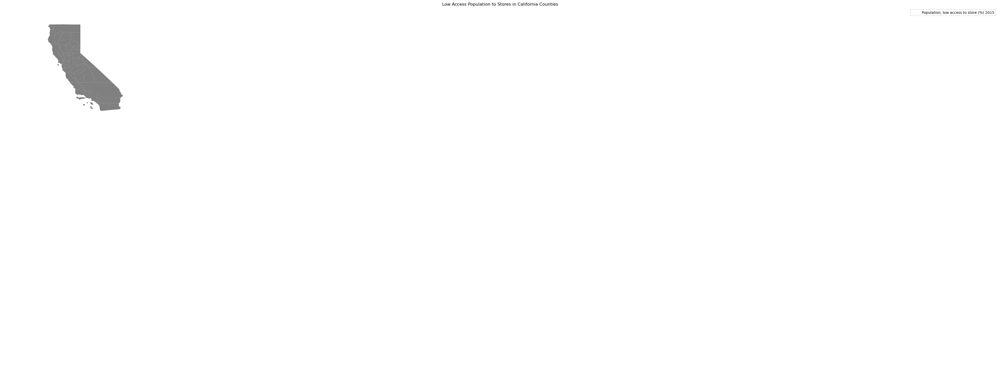

In [49]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50, 50))

ca_counties.plot(ax=ax, facecolor='gray')
merged_for_map.plot(column="Population, low access to store (%) 2015", cmap="Reds", ax=ax, legend=True)

ax.set_title("Low Access Population to Stores in California Counties")
ax.set_axis_off()
plt.show()

In [27]:
import plotly.express as px

fig = px.choropleth(merged_for_map,
                    geojson=merged_for_map.geometry.__geo_interface__,
                    locations='FIPS',
                    color='Population, low access to store (%) 2015',
                    projection="mercator",
                    hover_name='County',
                    hover_data={'FIPS': False,
                                'Population, low access to store (%) 2015': True})

fig.update_geos(fitbounds="locations", visible=False)
fig.show()

AttributeError: 'Series' object has no attribute '__geo_interface__'

In [57]:
import folium
from sklearn.preprocessing import MinMaxScaler
from branca.colormap import linear

merged_for_map.hvplot(geo=True, color='Population, low access to store (%) 2015', width=800, height=500,
                      hover_cols=['County'], alpha=0.8, legend=True)

:Curve   [index]   (Population, low access to store (%) 2015,County)

In [58]:
colormap = linear.YlOrRd_09.scale(
    merged_for_map['Population, low access to store (%) 2015'].min(),
    merged_for_map['Population, low access to store (%) 2015'].max())

In [66]:
m = folium.Map(location=[37.5, -119], zoom_start=6)

# add the counties as polygons with the color based on the data
for index, row in merged_for_map.iterrows():
    fips = row['FIPS']
    color = row['Population, low access to store (%) 2015']
    folium.GeoJson(
        row['geometry'],
        style_function=lambda x: {
            'fillColor': colormap(0),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7
        }
    ).add_child(folium.Popup(f"FIPS: {fips}")).add_to(m)

# add the color map to the map
colormap.caption = 'Population, low access to store (%) 2015'
m.add_child(colormap)



In [55]:
import plotly.figure_factory as ff


scope = ['CA']

fips = merged_for_map["FIPS"]
values = merged_for_map['Population, low access to store (%) 2015']


fig = ff.create_choropleth(fips=fips, values = values, scope=scope, 
    #color=['Population, low access to store (%) 2015'],
    round_legend_values=True,
    simplify_county=0, simplify_state=0,
    county_outline={'color': 'rgb(15, 15, 55)', 'width': 0.5},
    state_outline={'width': 1},
    legend_title='Food Desert %',
    title='County Food Desert %')

fig.layout.template = None
fig.show()

/Applications/anaconda3/lib/python3.9/site-packages/plotly/figure_factory/_county_choropleth.py:775: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.

/Applications/anaconda3/lib/python3.9/site-packages/plotly/figure_factory/_county_choropleth.py:331: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.

/Applications/anaconda3/lib/python3.9/site-packages/plotly/figure_factory/_county_choropleth.py:358: ShapelyDeprecationWarning:

The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.



TypeError: 'MultiPolygon' object is not iterable

In [ ]:
# fips= [Fresno: 06019, Kern: 06029, Kings: 06031, Madera: 06039, Mariposa: 06043, 
#        Merced: 06047, San Joaquin: 06077, Stanislaus: 06099, Tulare: 06107, Tuolumne: 06109, Amador: 06005,
#        Calaveras: 06009, El Dorado: 06017, Placer: 06061, Sacramento: 06067, Yolo County: 06113
#        Alameda: 06001, Contra Costa: 06013, Marin: 06041, Napa: 06055, San Francisco County: 06075,
#        San Mateo: 06081, Santa Clara: 06085, Solano: 06095, Sonoma: 06097]

#add a column for fips the fip numbers only
# Access_regions_desert_with_fips = Access_regions_desert['Fips':'']

fips = ['06019', '06029', '06031', '06039', '06043', '06047', 
        '06077', '06099', '06107', '06109', '06005', '06009', '06017', 
        '06061', '06067', '06113', '06001', '06013', '06041', 
        '06055', '06075', '06081', '06085', '06095', '06097']

# Access_regions_desert['FIPS'] = fips

In [56]:
merged_for_map['Population, low access to store (%) 2015'].dtype

dtype('float64')